<img align="right" src="../additional_data/banner.png" style="width:1100px;">

# Forest inventory

* [**Sign up to the JupyterHub**](https://www.phenocube.org/) to run this notebook interactively from your browser
* **Compatibility:** Notebook currently compatible with the Open Data Cube environments of the University of Wuerzburg
* **Prerequisites**: Users should review the [mosaic-](mosaic.ipynb), [export_geotiff-](export_geotiff.ipynb) notebook for more information about the basic steps for any given temporal and spatial combination. Further, knowledge about working with SQL can be useful. An understanding of the underlying data is important for creating a valid mosaic for further analyses.

### Background

Forests are complex biomes. Anaylzing them is an important task to enhance the understanding, also in the context of the current global change. Forests have an important role, e.g. econmical or as carbon sink, which can also be conenected to monetary aspects (CO2 certificates). Furhter societal benefits are in the context of healthcare, e.g. allergies or considering upcoming zoonoses like the Covid-19 pandemic as well as forests role in recreation.


This example tries to demonstrate a potential workflow from loading and processing (cloud removal, median-mosaicing, index calculation) satellite raster-data togehter with additional on-demand vector-data nd export them as cloud-optimized-geotiff for individual processing, e.g. in a local GIS.

### Preliminary steps

Python wird durch seine Funktionsbibliotheken (Pakete) leichter benutzbar. Wenn gewünscht können Warnungen unterdrückt werden, mit dem Paket warnings und der Funktion `filterwarnings`. Hier werden Warnungen ignoriert (ignore).

In [1]:
# Supress Warning
import warnings
warnings.filterwarnings('ignore')
# Import (geo)pandas package with shortcut (g)pd
import pandas as pd
import geopandas as gpd
# Load Data Cube Configuration
import datacube
dc = datacube.Datacube(app = 'forest_inventory', config = '/home/datacube/.datacube.conf')
import sys

### Loading your area of interest as sahepfile (here: different conservation zones in Rhoen Highlands)

An dieser Stelle wird Rhoen direkt als Geojson in einen Geopandas (Python-Funktionen-Paket) Dataframe (Tabelle, Matrix, Array, ... nicht verwirren lassen)

In [2]:
rhoen = gpd.read_file('../additional_data/rhoen.geojson') # hier loakel Struktur anpassen

### Alternative load data from PostGIS (spatial PostgreSQL-extension)

Über eine Datenbank (hier PostgreSQL mit PostGIS extension) werden hier Geodaten (Bundeswaldinventur 2012) geladen. Dabei werden Funktionen aus dem Paket `psycopg2` verwendet und Anmeldedaten für die Datenbank in Variablen geschrieben (bspw. user = 'dc_user').

In [3]:
# database API
import psycopg2
# PostGIS connection credentials
user = 'dc_user'
password = 'localuser1234'
host = '127.0.0.1'
port = '5432'
database = 'datacube'

Die Verbindung wird hergestellt (connection = ...) und verschiedene (Geo)dataframes erzeugt
- forest attributes: Alle Daten von der Bundeswaldinventur 2012 (Name in Datenbank: etrs89_bwi_2012p; geladen als geopandas dataframe)
- attributes: Attribute wie, bspw. Baumartenverteilung (pandas dataframe)
- forest: Auswahl von Waldtrakten (Bundeswaldinventuruntersuchungsflächen Nr. 116618 - 16624, geopandas dataframe)

Danach wird die Verbindung geschlossen, connection.close(), close ist hier wieder eine Funktione aus dem psycopg2 Paket. Attribute für die Darstellung in der folgenden Karte aufbereitet (Reprojektion in EPSG:4326)

In [4]:
# 1. open connection first, 2. write data, 3. close afterwards
connection = psycopg2.connect(database=database, user=user, password=password, host=host)

# Forest inventory data downloaded: 'GFs_ReinbestandGattung_mitSp_PolyVar'
# see https://bwi.info/

# sql statement looking for 'geom, tnr, pquerus (percent share oak), pfagus (percent share beech), pfraxinus (percent share ash), 
# pabies (percent share fir)  ppicea (percent share spruce), ppinus (percetn share pine)'
forest_inventory = gpd.GeoDataFrame.from_postgis("SELECT * FROM etrs89_bwi_2012p;", connection)
attributes =pd.read_sql_query("SELECT  column_name FROM information_schema.columns WHERE table_name = 'etrs89_bwi_2012p';",con=connection)
forest = gpd.GeoDataFrame.from_postgis("SELECT * FROM etrs89_bwi_2012p WHERE tnr > 16617 AND tnr < 16623 ;", connection)

connection.close()

attributes = attributes.column_name
attributes = list(attributes)
attributes.remove('geom')

forest_inventory_wgs = forest_inventory.to_crs('EPSG:4326')
forest_wgs = forest.to_crs('EPSG:4326')
#forest_inventory

Das Paket Folium dient zu Visualisierung in einer Karte, style ist eine Farbkombination (sh. hexadezimale Farbcodes). Map ist eine Funktion um eine Karte darzustellen (lat/lon 49/11, zoomfaktor 7), Openstreetmap ist Standard wird mit der Funktin TileLayer um ein Esri Karte ergänzt. Auskommentierte TileLayer würde nochmal Openstreetmap laden. LatLngPopup zeigt Koordinaten bei Klick in Karte an (nervt evtl.). LayerControl erlaubt eine interaktive Wahl der Layer in der Karte.

In [5]:
import folium

# define polygon style
style = {'fillColor': '#ffffffff', 'color': '#000000'}

# open map 'm' with defined center and zomm level
m = folium.Map([49, 11], zoom_start=7)#, tiles='Stamen Terrain')

# load esris satellite map
folium.TileLayer(
        tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr = 'Esri',
        name = 'Esri Satellite',
        overlay = False,
        control = True
       ).add_to(m)

# add geojson with all inventory
folium.GeoJson(forest_inventory_wgs, style_function=lambda x: style, name="bwi",
                             tooltip=folium.features.GeoJsonTooltip(fields=attributes, localize=True)).add_to(m)
# add Rhoen biosphere
folium.GeoJson(rhoen, name="Rhoen",
              tooltip=folium.features.GeoJsonTooltip(fields=['zone','zone_nam'],localize=True)).add_to(m)

# load openstreet map
#folium.TileLayer('openstreetmap').add_to(m)

# load terrain map
folium.TileLayer('Stamen Terrain').add_to(m)

# add lat/lon popup after click on maps
#folium.LatLngPopup().add_to(m)

#
#folium.ClickForMarker().add_to(m)
# open layer control in upper right corner of the map
folium.LayerControl().add_to(m)
m

Hier extrahieren wir die Abmessung des Biosphärenreservats Rhön in EPSG:25832 (offizielle bayerische Referenz)

In [6]:
rhoen_utm = rhoen.to_crs('EPSG:25832')

minx = rhoen_utm.bounds.minx.min()
maxx = rhoen_utm.bounds.maxx.max()
miny = rhoen_utm.bounds.miny.min()
maxy = rhoen_utm.bounds.maxy.max()

Die Extents anzeigen mit

In [7]:
print('Minimum X: ',minx)

Minimum X:  544455.8245999999


## Load Sentinel-2 data from the datacube

Here we are loading a timeseries of `Sentinel-2` satellite images through the datacube API.(official coordinate system ['EPSG:25832'](https://www.ldbv.bayern.de/file/pdf/12867/Faltblatt_UTM-Umstellung.pdf))

Zuerst schreiben wir die Suchvariablen, danach laden wir die Daten über das Paket datacube und der Funktion dc.load('Suchvariablen')

In [8]:
# Create query variables
product = 's2_l2a_bavaria'
x_min = minx
x_max = maxx
y_min = miny
y_max = maxy
cosy = 'EPSG:25832'

# geht hier nur über sog. dask-chunks für die komplette Zeitreihe

time_extent = ('2015-07-01', '2020-12-31')
dask_chunks = {"time": 1, "x": 1000, "y": 1000}

Loading may take a few minutes

Über Dask geht es schneller, weil die Daten nicht vor der Nutzung im Speicher liegen

In [12]:
# Load data
dataset = dc.load(product=product,
                  y= (y_min, y_max),
                  x=(x_min, x_max),
                  crs=cosy,
                  time=time_extent,
                  dask_chunks=dask_chunks)

Hier sortiert nach Saisonzugehörigkeit, nur anzeigen. Vielleicht braucht man das...

In [23]:
dataset["time.season"]

<xarray.DataArray 'season' (time: 944)>
array(['JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA',
       'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON',
       'SON', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF',
       'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'MAM', 'MAM', 'MAM',
       'MAM', 'MAM', 'MAM', 'MAM', 'MAM', 'MAM', 'MAM', 'MAM', 'MAM',
       'MAM', 'MAM', 'MAM', 'MAM', 'MAM', 'JJA', 'JJA', 'JJA', 'JJA',
       'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA',
       'JJA', 'JJA', 'JJA', 'JJA', 'SON', 'SON', 'SON', 'SON', 'SON',
       'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON',
       'SON', 'SON', 'SON', 'SON', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF',
       'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF',
       'DJF', 'DJF', 'MAM', 'MAM', 'MAM', 'MAM', 'MAM', 'MAM', 'MAM',
       'MAM', 'MAM', 'MAM', 'MAM', 'MAM', 'MAM', 'MAM', 'MAM', 'MAM',
       'MAM', 'MAM', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA',
       'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA',
       'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA',
       'JJA', 'JJA', 'JJA', 'JJA', 'SON', 'SON', 'SON', 'SON', 'SON',
       'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON',
       'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON',
       'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON',
...
       'MAM', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA',
       'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA',
       'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA',
       'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA',
       'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA',
       'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA',
       'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA',
       'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA', 'JJA',
       'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON',
       'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON',
       'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON',
       'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON',
       'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON',
       'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON',
       'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON',
       'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON', 'SON',
       'SON', 'SON', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF',
       'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF',
       'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF', 'DJF'],
      dtype='<U3')
Coordinates:
  * time         (time) datetime64[ns] 2015-07-30T10:30:16 ... 2020-12-30T10:...
    spatial_ref  int32 25832

Dask-Beispiel, da wir die Daten nicht physich in de Speicher gelegt haben, durch die Nutzung von Dask-Arrays, müssen wir sie bei Bedarf in den Speicher legen durch `compute()`. Dauert sehr lange, muss bei Fehlermeldung ggf. ein zweites mal ausgehführt werden. Ist hier aber nicht notwendig kann aber als Beispiel ausgeführt werden.

Ärgerlich, weil es danach im Speicher liegt.

In [ ]:
# kopier dir nachfolgendes in die zwischenablage
dataset.sel(time=slice('2015-07-01', '2015-08-31'))

In [22]:
dataset.sel(time=slice('2015-07-01', '2015-08-31')).compute()

<xarray.Dataset>
Dimensions:          (time: 9, x: 5003, y: 8680)
Coordinates:
  * time             (time) datetime64[ns] 2015-07-30T10:30:16 ... 2015-08-29...
  * y                (y) float64 5.637e+06 5.637e+06 ... 5.55e+06 5.55e+06
  * x                (x) float64 5.445e+05 5.445e+05 ... 5.945e+05 5.945e+05
    spatial_ref      int32 25832
Data variables:
    coastal_aerosol  (time, y, x) int16 954 954 954 954 954 ... 205 205 205 205
    blue             (time, y, x) int16 1444 1362 1406 1340 ... 165 217 305 215
    green            (time, y, x) int16 1558 1518 1498 1430 ... 414 482 583 431
    red              (time, y, x) int16 1656 1704 1716 1694 ... 230 292 420 308
    red_edge1        (time, y, x) int16 1865 1813 1813 1845 ... 884 884 808 808
    red_edge2        (time, y, x) int16 3109 2896 2896 2834 ... 2638 2016 2016
    red_edge3        (time, y, x) int16 3593 3339 3339 3351 ... 3279 2043 2043
    nir              (time, y, x) int16 3860 3752 3738 3552 ... 3204 3124 1910
    narrow_nir       (time, y, x) int16 3914 3665 3665 3516 ... 3457 2654 2654
    water_vapour     (time, y, x) int16 3813 3813 3813 3813 ... 2942 2942 2942
    swir1            (time, y, x) int16 3053 3218 3218 3446 ... 2001 1662 1662
    swir2            (time, y, x) int16 2075 2257 2257 2257 ... 948 948 789 789
    scl              (time, y, x) uint8 4 4 4 5 5 4 4 4 4 ... 4 4 4 4 4 4 4 4 4
Attributes:
    crs:           EPSG:25832
    grid_mapping:  spatial_ref

Datensatz anschauen im xarray (Python Paket zur Datenverarbeitung)

In [24]:
# dsplay an overview of the data
dataset

,Array,Chunk
Bytes,81.99 GB,2.00 MB
Shape,"(944, 8680, 5003)","(1, 1000, 1000)"
Count,55360 Tasks,50976 Chunks
Type,int16,numpy.ndarray
,Array,Chunk
Bytes,81.99 GB,2.00 MB
Shape,"(944, 8680, 5003)","(1, 1000, 1000)"
Count,55360 Tasks,50976 Chunks
Type,int16,numpy.ndarray
,Array,Chunk


### Plot an rgb image to confirm we have data

The 'time' dimension above (68) shows the number of observations and is also the range that can be choosen, considering that Python starst counting with `0`, so we can choose between 0 and 67.

Hier fügt man eine Systempfad hinzu, der zu einer lokal gespeicherten Funktion mit dem Namen rgb() führt. rgb zeigt aud 'dataset', index sind die timesteps, und stretched die Verteilung 0,01-0,99, size gibt die Größe des angezeigten Bilds an.<br>
2015 Herbst und Winter ist, bei einem ersten blick nicht sehr ergiebig.

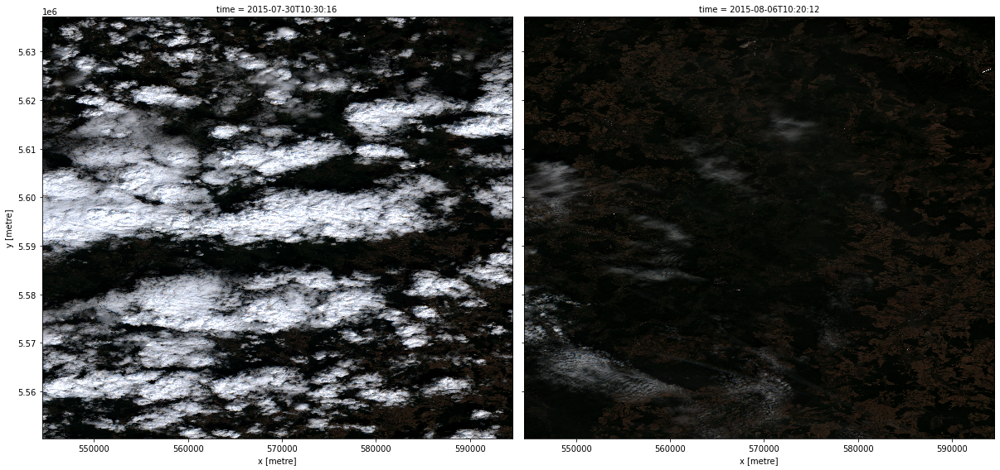

In [28]:
sys.path.append('/datacube/data_cube_notebooks/datacube/Scripts')
from DEAPlotting import rgb

rgb(dataset, index=[0,1], percentile_stretch=(0.01, 0.99), size=8)

# laden über dask array könnte man so realisieren
# ist aber nicht nötig, wir wissen das daten das sind
#rgb(dataset.sel(time=slice('2015-07-01', '2015-08-31')).compute(), index=[0,1], percentile_stretch=(0.01, 0.99), size=8)


### Add a new 'measurements', i.e. measurment ratios, to the data

You can find a big overview of indices here: <br> https://www.indexdatabase.de

Here we use  and a normalized difference vegetation/water index (NDVI/NDWI) and add them to the dataset.

Hier bieten sich ggf. weiter Indizes an.

In [29]:
NDVI8A = (dataset.narrow_nir - dataset.red)/(dataset.narrow_nir + dataset.red)
NDVI8 = (dataset.nir - dataset.red)/(dataset.nir + dataset.red)
NDWI8 = (dataset.nir - dataset.swir2)/(dataset.nir + dataset.swir2)
NDWI8A = (dataset.narrow_nir - dataset.swir2)/(dataset.narrow_nir + dataset.swir2)


dataset['ndvi8a'] = NDVI8A
dataset['ndvi8'] = NDVI8
dataset['ndwi8a'] = NDWI8A
dataset['ndwi8'] = NDWI8

We can control if there are new entries in 'dataset'

In [30]:
dataset

,Array,Chunk
Bytes,81.99 GB,2.00 MB
Shape,"(944, 8680, 5003)","(1, 1000, 1000)"
Count,55360 Tasks,50976 Chunks
Type,int16,numpy.ndarray
,Array,Chunk
Bytes,81.99 GB,2.00 MB
Shape,"(944, 8680, 5003)","(1, 1000, 1000)"
Count,55360 Tasks,50976 Chunks
Type,int16,numpy.ndarray
,Array,Chunk


## Masking out clouds
Loading needed functions first

In [31]:
#from s2fn import s2_unpack_scl
import xarray as xr
from xarray.ufuncs import logical_and as xr_and
from xarray.ufuncs import logical_or  as xr_or
import numpy as np
import pandas as pd
from functools import partial 

def s2_scl_clean_mask(dataset, cover_types=['vegetation', 'vegetation']):# here, masking everything instead of scl 'vegetation'
    clean_mask = None
    # Keep all specified cover types (e.g. 'clear', 'water'), so logically or the separate masks.
    for i, cover_type in enumerate(cover_types):
        cover_type_clean_mask = s2_unpack_scl(dataset.scl, cover_type)
        clean_mask = cover_type_clean_mask if i == 0 else xr_or(clean_mask, cover_type_clean_mask)
    return clean_mask

def unpack_s2bits(s2_scl_endcoding, data_array, cover_type):
    boolean_mask = np.isin(data_array.values, s2_scl_endcoding[cover_type]) 
    return xr.DataArray(boolean_mask.astype(bool),
                        coords = data_array.coords,
                        dims = data_array.dims,
                        name = cover_type + "_mask",
                        attrs = data_array.attrs)

def s2_unpack_scl(data_array , cover_type):
    s2_scl_endcoding = dict(no_data                       =[0],
                                saturated_or_defective        =[1],
                                dark_area_pixels              =[2],
                                cloud_shadows                 =[3],
                                vegetation                    =[4],
                                not_vegetated                 =[5],
                                water                         =[6],
                                unclassified                  =[7],
                                cloud_medium_probability      =[8],
                                cloud_high_probability        =[9],
                                thin_cirrus                   =[10],
                                snow                          =[11],
                                cloud                         =[3,8,9,10],
                                cloud_free                    =[4,5,6]
                               )
    return unpack_s2bits(s2_scl_endcoding, data_array, cover_type)

def s2_clean_mask(ds, bands):
    masks = [s2_unpack_scl(ds, band) for band in bands]
    return np.logical_or(*masks).values

def s2_cct(dataset):
    times  = list(dataset.time.values)
    scene_slice_list = list(map(lambda t: dataset.sel(time = t).scl, times))
    clean_mask_list = list(map(partial(s2_clean_mask, bands = ['vegetation','vegetation']), scene_slice_list))
    clean_pixel_count_list = list(map(np.sum, clean_mask_list))
    percentage_list = list(map(lambda x:np.sum(x)/(x.shape[0] * x.shape[1] * 0.01), clean_mask_list))

    data = {"Acquisition time": times,
            "Vegetation [%]": percentage_list,
            "Vegetation pixel [n]": clean_pixel_count_list }
    
    return pd.DataFrame(data=data, columns = ["Acquisition time", "Vegetation [%]", "Vegetation pixel [n]"])



### Make a vegetation overview
Write new variable 'cloudtable' using the defined function s2_cct

Nochmal gecheckt, für "Sommer 2015", scheint doch etwas dabei zu sein. Mosaik sei dank!

In [33]:
cloudtable = s2_cct(dataset.sel(time=slice('2015-07-01', '2015-08-31'))) # über die slices werde die zeitschrite bestimmt
# print the table
#cloudtable

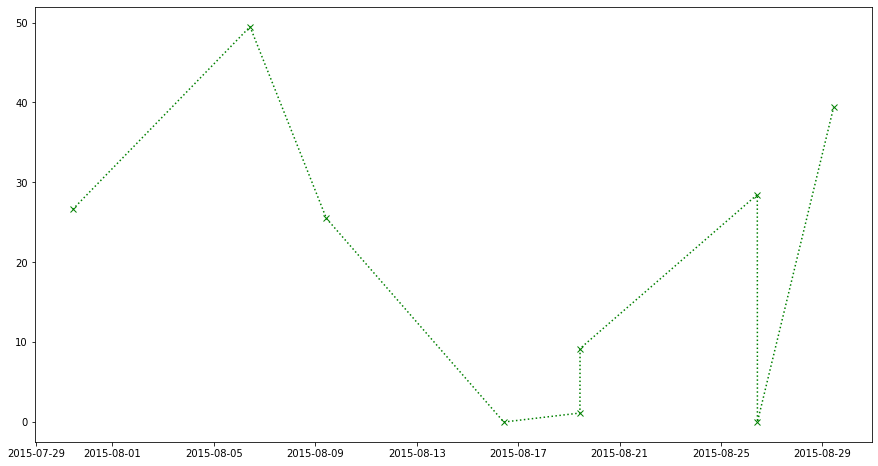

In [34]:
import matplotlib.pyplot as plt

plt.figure(figsize = (15,8))
plt.plot(cloudtable["Acquisition time"].values, cloudtable["Vegetation [%]"].values, 'gx:', markersize=6)
plt.show()

### Mask data

Use again the previous defined functions to write the 'cloud_mask'

In [35]:
cloud_mask = s2_scl_clean_mask(dataset.sel(time=slice('2015-07-01', '2015-08-31')))

And use the mask to write 'cleaned_dataset'. The 'cleaned_dataset' here only carries pixels classified as vegetation.

In [36]:
cleaned_dataset = dataset.sel(time=slice('2015-07-01', '2015-08-31')).where(cloud_mask)

In [37]:
cleaned_dataset

<xarray.Dataset>
Dimensions:          (time: 9, x: 5003, y: 8680)
Coordinates:
  * time             (time) datetime64[ns] 2015-07-30T10:30:16 ... 2015-08-29...
  * y                (y) float64 5.637e+06 5.637e+06 ... 5.55e+06 5.55e+06
  * x                (x) float64 5.445e+05 5.445e+05 ... 5.945e+05 5.945e+05
    spatial_ref      int32 25832
Data variables:
    coastal_aerosol  (time, y, x) float64 dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    blue             (time, y, x) float64 dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    green            (time, y, x) float64 dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    red              (time, y, x) float64 dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    red_edge1        (time, y, x) float64 dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    red_edge2        (time, y, x) float64 dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    red_edge3        (time, y, x) float64 dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    nir              (time, y, x) float64 dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    narrow_nir       (time, y, x) float64 dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    water_vapour     (time, y, x) float64 dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    swir1            (time, y, x) float64 dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    swir2            (time, y, x) float64 dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    scl              (time, y, x) float64 dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    ndvi8a           (time, y, x) float64 dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    ndvi8            (time, y, x) float64 dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    ndwi8a           (time, y, x) float64 dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    ndwi8            (time, y, x) float64 dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
Attributes:
    crs:           EPSG:25832
    grid_mapping:  spatial_ref

## Generating median mosaics

This method masks clouds from imagery using the median of the cloud-free pixels in the time series.

In [38]:
sys.path.append('/datacube/data_cube_notebooks/sebastian_foertsch/utils/')

In [39]:
from data_cube_utilities.dc_mosaic import create_median_mosaic
median_composite = create_median_mosaic(cleaned_dataset, cloud_mask)

Hier können alle Bänder relativ schnell angezeigt werden: `median_composite.red.plot(size=10)`
Wobei `<name-des-datensatzes>.<name-des-bands-oder-messung.<was-mach-ich-damit:plot!(<in-größe-x>)`

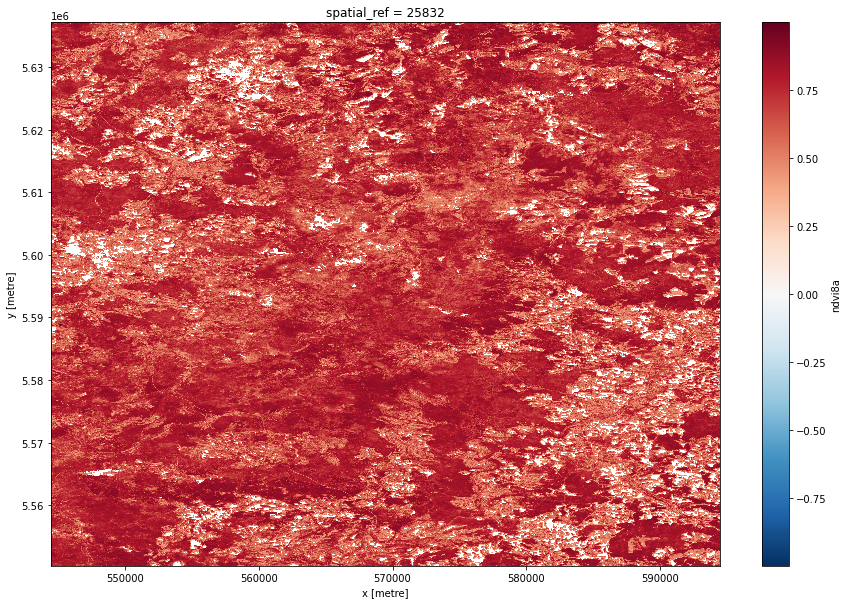

In [40]:
# Plot single bands, with <dataset_name>.<band_name>.plot(size=<integer>)
#median_composite.nir.plot(size=10) # for NIR band
median_composite.ndvi8a.plot(size=10) #
# ...


Hier kann man sich das Komposit anzeigen lassen, bleibt ggf. wenig übrig.

In [41]:
# Plot three-band-composite
# Also try changing the percentile stretch
#rgb(median_composite, bands=['red','green','blue'], percentile_stretch = (0.01,0.99), size = 12)
# False color
rgb(median_composite, bands=['nir', 'red', 'green'], percentile_stretch = (0.01,0.99), size = 12)

ValueError: dimension variable on 0th function argument to apply_ufunc with dask='parallelized' consists of multiple chunks, but is also a core dimension. To fix, either rechunk into a single dask array chunk along this dimension, i.e., ``.chunk(variable: -1)``, or pass ``allow_rechunk=True`` in ``dask_gufunc_kwargs`` but beware that this may significantly increase memory usage.

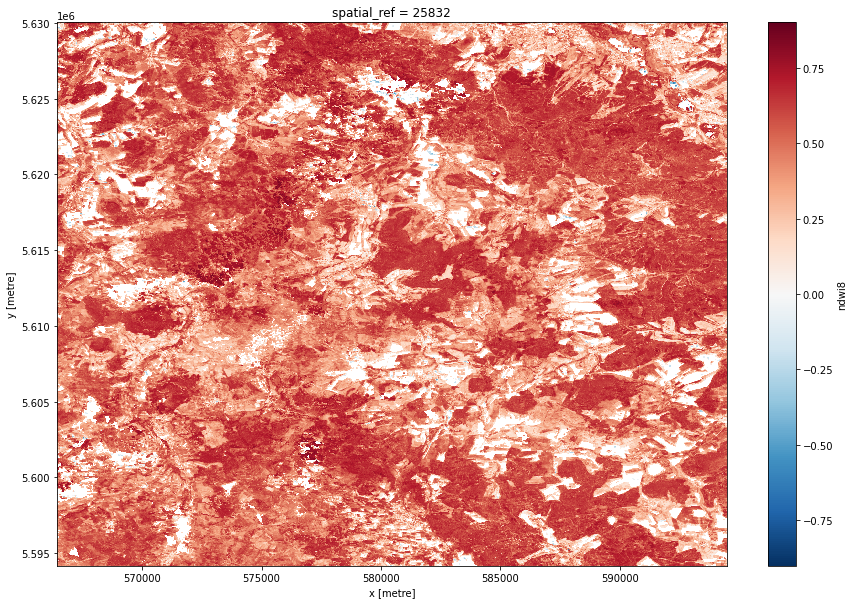

In [38]:
# Plot single bands, with <dataset_name>.<band_name>.plot(size=<integer>)
#median_composite.nir.plot(size=10) # for NIR band
median_composite.ndwi8.plot(size=10) # 
# ...


## Export to cloud optimized geotiff (cog)

Importing needed function from local directories.

In [38]:
from datacube.utils.cog import write_cog

Export for one band:

In [40]:
red_band = median_composite.red

# Write GeoTIFF to a location
write_cog(geo_im=red_band,
          fname='red_median.tif',
          overwrite=True)

PosixPath('red_median.tif')

Export all bands:

Sollten wir verwenden

In [37]:
rgb_da = median_composite.to_array()

# Write multi-band GeoTIFF to a location
write_cog(geo_im=rgb_da,
          fname='rgb_median.tif',
          # Add a custom folder:
          # fname=
          overwrite=True)

NameError: name 'write_cog' is not defined

Hier mit export über dask, bei Bedarf compute()-Zelle ausführen

In [ ]:
ds_delayed = write_cog(geo_im=dataset.isel(time=1).to_array(), 
                       fname='dask_geotiff01.tif',
                       overwrite=True)

# Print dask.delayed object
print(ds_delayed)

In [ ]:
ds_delayed.compute()

## Workflow in a nutshell, lazy-loading and writing multiband-cloud-masked median-mosaic-compsites

In [16]:
# Supress Warning
import warnings
warnings.filterwarnings('ignore')
# Import (geo)pandas package with shortcut (g)pd
import pandas as pd
import geopandas as gpd
# Load Data Cube Configuration
import datacube
dc = datacube.Datacube(app = 'forest_inventory', config = '/home/datacube/.datacube.conf')
import sys


rhoen = gpd.read_file('../additional_data/rhoen.geojson') # hier loakel Struktur anpassen
rhoen_utm = rhoen.to_crs('EPSG:25832')
minx = rhoen_utm.bounds.minx.min()
maxx = rhoen_utm.bounds.maxx.max()
miny = rhoen_utm.bounds.miny.min()
maxy = rhoen_utm.bounds.maxy.max()


# Create query variables
product = 's2_l2a_bavaria'
x_min = minx
x_max = maxx
y_min = miny
y_max = maxy
cosy = 'EPSG:25832'
time_extent = ('2015-07-01', '2020-12-31')
dask_chunks = {"time": 1, "x": 1000, "y": 1000}

# Load data
dataset = dc.load(product=product,
                  y= (y_min, y_max),
                  x=(x_min, x_max),
                  crs=cosy,
                  time=time_extent,
                  dask_chunks=dask_chunks)
# add more, or comment out with '#'
NDVI8A = (dataset.narrow_nir - dataset.red)/(dataset.narrow_nir + dataset.red)
NDVI8 = (dataset.nir - dataset.red)/(dataset.nir + dataset.red)
NDWI8 = (dataset.nir - dataset.swir2)/(dataset.nir + dataset.swir2)
NDWI8A = (dataset.narrow_nir - dataset.swir2)/(dataset.narrow_nir + dataset.swir2)

dataset['ndvi8a'] = NDVI8A
dataset['ndvi8'] = NDVI8
dataset['ndwi8a'] = NDWI8A
dataset['ndwi8'] = NDWI8

In [17]:
#from s2fn import s2_unpack_scl
import xarray as xr
from xarray.ufuncs import logical_and as xr_and
from xarray.ufuncs import logical_or  as xr_or
import numpy as np
import pandas as pd
from functools import partial 

def s2_scl_clean_mask(dataset, cover_types=['vegetation', 'vegetation']):# here, masking everything instead of scl 'vegetation'
    clean_mask = None
    # Keep all specified cover types (e.g. 'clear', 'water'), so logically or the separate masks.
    for i, cover_type in enumerate(cover_types):
        cover_type_clean_mask = s2_unpack_scl(dataset.scl, cover_type)
        clean_mask = cover_type_clean_mask if i == 0 else xr_or(clean_mask, cover_type_clean_mask)
    return clean_mask

def unpack_s2bits(s2_scl_endcoding, data_array, cover_type):
    boolean_mask = np.isin(data_array.values, s2_scl_endcoding[cover_type]) 
    return xr.DataArray(boolean_mask.astype(bool),
                        coords = data_array.coords,
                        dims = data_array.dims,
                        name = cover_type + "_mask",
                        attrs = data_array.attrs)

def s2_unpack_scl(data_array , cover_type):
    s2_scl_endcoding = dict(no_data                       =[0],
                                saturated_or_defective        =[1],
                                dark_area_pixels              =[2],
                                cloud_shadows                 =[3],
                                vegetation                    =[4],
                                not_vegetated                 =[5],
                                water                         =[6],
                                unclassified                  =[7],
                                cloud_medium_probability      =[8],
                                cloud_high_probability        =[9],
                                thin_cirrus                   =[10],
                                snow                          =[11],
                                cloud                         =[3,8,9,10],
                                cloud_free                    =[4,5,6]
                               )
    return unpack_s2bits(s2_scl_endcoding, data_array, cover_type)

def s2_clean_mask(ds, bands):
    masks = [s2_unpack_scl(ds, band) for band in bands]
    return np.logical_or(*masks).values

def s2_cct(dataset):
    times  = list(dataset.time.values)
    scene_slice_list = list(map(lambda t: dataset.sel(time = t).scl, times))
    clean_mask_list = list(map(partial(s2_clean_mask, bands = ['vegetation','vegetation']), scene_slice_list))
    clean_pixel_count_list = list(map(np.sum, clean_mask_list))
    percentage_list = list(map(lambda x:np.sum(x)/(x.shape[0] * x.shape[1] * 0.01), clean_mask_list))

    data = {"Acquisition time": times,
            "Vegetation [%]": percentage_list,
            "Vegetation pixel [n]": clean_pixel_count_list }
    
    return pd.DataFrame(data=data, columns = ["Acquisition time", "Vegetation [%]", "Vegetation pixel [n]"])



In [18]:
# Zeitschritte
start = ('2015-07-01')
end = ('2015-08-31')

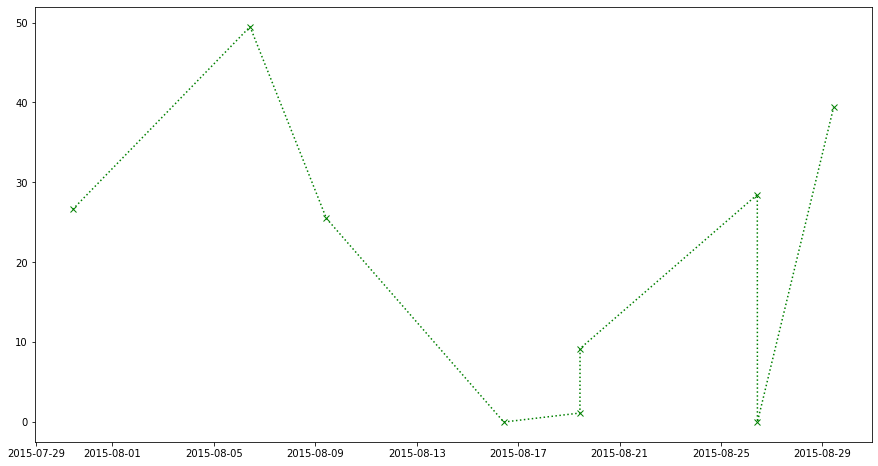

In [19]:
# Fall gewünscht cloudtable, wenn fehler beim ersten ausführen, zweites mal ausführen
cloudtable = s2_cct(dataset.sel(time=slice(start, end))) # über die slices werde die zeitschrite bestimmt
# und anzeigen
import matplotlib.pyplot as plt

plt.figure(figsize = (15,8))
plt.plot(cloudtable["Acquisition time"].values, cloudtable["Vegetation [%]"].values, 'gx:', markersize=6)
plt.show()

In [20]:
#maskieren
cloud_mask = s2_scl_clean_mask(dataset.sel(time=slice(start, end)))
cleaned_dataset = dataset.sel(time=slice(start, end)).where(cloud_mask)
#mosaikieren
sys.path.append('/datacube/data_cube_notebooks/sebastian_foertsch/utils/')
from data_cube_utilities.dc_mosaic import create_median_mosaic
median_composite = create_median_mosaic(cleaned_dataset, cloud_mask)

In [21]:
median_composite

<xarray.Dataset>
Dimensions:          (x: 5003, y: 8680)
Coordinates:
  * y                (y) float64 5.637e+06 5.637e+06 ... 5.55e+06 5.55e+06
  * x                (x) float64 5.445e+05 5.445e+05 ... 5.945e+05 5.945e+05
    spatial_ref      int32 25832
Data variables:
    coastal_aerosol  (y, x) float64 dask.array<chunksize=(1000, 1000), meta=np.ndarray>
    blue             (y, x) float64 dask.array<chunksize=(1000, 1000), meta=np.ndarray>
    green            (y, x) float64 dask.array<chunksize=(1000, 1000), meta=np.ndarray>
    red              (y, x) float64 dask.array<chunksize=(1000, 1000), meta=np.ndarray>
    red_edge1        (y, x) float64 dask.array<chunksize=(1000, 1000), meta=np.ndarray>
    red_edge2        (y, x) float64 dask.array<chunksize=(1000, 1000), meta=np.ndarray>
    red_edge3        (y, x) float64 dask.array<chunksize=(1000, 1000), meta=np.ndarray>
    nir              (y, x) float64 dask.array<chunksize=(1000, 1000), meta=np.ndarray>
    narrow_nir       (y, x) float64 dask.array<chunksize=(1000, 1000), meta=np.ndarray>
    water_vapour     (y, x) float64 dask.array<chunksize=(1000, 1000), meta=np.ndarray>
    swir1            (y, x) float64 dask.array<chunksize=(1000, 1000), meta=np.ndarray>
    swir2            (y, x) float64 dask.array<chunksize=(1000, 1000), meta=np.ndarray>
    scl              (y, x) float64 dask.array<chunksize=(1000, 1000), meta=np.ndarray>
    ndvi8a           (y, x) float64 dask.array<chunksize=(1000, 1000), meta=np.ndarray>
    ndvi8            (y, x) float64 dask.array<chunksize=(1000, 1000), meta=np.ndarray>
    ndwi8a           (y, x) float64 dask.array<chunksize=(1000, 1000), meta=np.ndarray>
    ndwi8            (y, x) float64 dask.array<chunksize=(1000, 1000), meta=np.ndarray>

In [24]:
#export
from datacube.utils.cog import write_cog
lazy_ds = write_cog(geo_im=median_composite.to_array(), 
                       fname='dask_geotiff01.tif',
                       overwrite=True)

In [ ]:
# starte des tif raus schreibens mit
lazy_ds.compute()